# in progress

In [2]:
# Install helmet-assignment helper code
# !pip install input/helmet-assignment-helpers/helmet-assignment-main/ > /dev/null 2>&1
from helmet_assignment.score import NFLAssignmentScorer, check_submission
from helmet_assignment.features import add_track_features

import numpy as np
import pandas as pd
import glob
import os
import cv2
import itertools
from sklearn.metrics import accuracy_score
from tqdm.auto import tqdm
from multiprocessing import Pool
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
import random
random.seed(42)
from matplotlib.pyplot import figure

import sys
sys.path.append('input/easydict-master/easydict-master/')
# https://github.com/mikel-brostrom/Yolov5_DeepSort_Pytorch
sys.path.append('input/yolov5-deepsort-pytorch/Yolov5_DeepSort_Pytorch-master/Yolov5_DeepSort_Pytorch-master/deep_sort_pytorch/')
from deep_sort.deep_sort import DeepSort
from utils.parser import get_config
from helmet_assignment.video import video_with_predictions
from IPython.display import Video, display


In [3]:
def plot_one_box(x, im, color=None, label=None, line_thickness=3):
    # Plots one bounding box on image 'im' using OpenCV
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(im, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(im, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    return im

def find_nearest(array, value): # находит значение ближайшего est_frame-а к value (фрэйму)
    value = int(value)
    array = np.asarray(array).astype(int)
    idx = (np.abs(array - value)).argmin() # из номеров est_frame вычитаем frame, берем модуль. Находим индекс минимального элемента в массиве
    return array[idx] # значение ближайшего est_frame-а

def create_triangle(center, sidelength): # The area of the triangle with sidelength=10 equals 40
    a_x = int(center[0] - sidelength/2)
    b_x = int(center[0] + sidelength/2)
    c_x = int(center[0])
    
    h = int(round(math.sqrt(sidelength**2 - (sidelength/2)**2)))
    a_y = int(center[1] - h/2)
    b_y = int(center[1] - h/2)
    c_y = int(center[1] + h/2)
    
    return np.array([[a_x, a_y], [b_x, b_y], [c_x, c_y]])

def modern_posit(image_pts, world_pts, focal_length, center):
    nb_points = np.shape(image_pts)[0]

    # centered & scaled pixel coordinates
    centered_image = np.divide(np.subtract(image_pts, center), focal_length)
    ui = centered_image[:, 0]
    vi = centered_image[:, 1]

    # homogeneous world coordinates
    homogeneous_world_pts = np.append(world_pts, np.ones((nb_points, 1)), 1)

    # pseudo inverse
    object_mat = np.linalg.pinv(homogeneous_world_pts)
    #print(object_mat)

    converged = 0
    count = 0
    t_x = 0.0
    t_y = 0.0
    t_z = 0.0
    r1 = 0.0
    r2 = 0.0
    r3 = 0.0
    while converged == 0:
        # POS part of the algorithm
        # rotation vectors
        r1_t = np.matmul(object_mat, ui)
        r2_t = np.matmul(object_mat, vi)
        # 1/t_z1 is norm of r1_t
        t_z1 = 1 / np.linalg.norm(r1_t[0:3])
        # 1/tz_2 is norm of r2_t
        t_z2 = 1 / np.linalg.norm(r2_t[0:3])
        
        # geometric average
        t_z = np.sqrt(t_z1 * t_z2)
        
        r1_n = np.multiply(r1_t, t_z)
        r2_n = np.multiply(r2_t, t_z)
        r1 = r1_n[0:3]
        r2 = r2_n[0:3]
        r3 = np.cross(r1, r2)
        r3_t = np.append(r3, t_z)
        t_x = r1_n[3]
        t_y = r2_n[3]

        # Now update the z/T z or epsilon
        # then ui, vi
        epsilon_i = np.matmul(homogeneous_world_pts, np.divide(r3_t, t_z))
        old_ui = ui
        old_vi = vi
        ui = np.multiply(epsilon_i, centered_image[:, 0])
        vi = np.multiply(epsilon_i, centered_image[:, 1])

        # check for convergence
        delta_ui = ui - old_ui
        delta_vi = vi - old_vi
        delta = np.square(focal_length) * (np.square(np.linalg.norm(delta_ui)) + np.square(np.linalg.norm(delta_vi)))

        converged = 1 if count > 0 and delta < 1 else 0
        count = count + 1
        if count > 1000:
            break

    trans = np.array([t_x, t_y, t_z], np.float64)
    rot = np.array([r1, r2, r3], np.float64)
    
    return rot, trans, count

def get_3d_angles(R):
    """
    Illustration of the rotation matrix / sometimes called 'orientation' matrix
    R = [ 
           R11 , R12 , R13, 
           R21 , R22 , R23,
           R31 , R32 , R33  
        ]

    REMARKS: 
    1. this implementation is meant to make the mathematics easy to be deciphered
    from the script, not so much on 'optimized' code. 
    You can then optimize it to your own style. 

    2. I have utilized naval rigid body terminology here whereby; 
    2.1 roll -> rotation about x-axis 
    2.2 pitch -> rotation about the y-axis 
    2.3 yaw -> rotation about the z-axis (this is pointing 'upwards') 
    https://stackoverflow.com/questions/15022630/how-to-calculate-the-angle-from-rotation-matrix
    """
    from math import asin, pi, atan2, cos 

    R11 = R[0][0]
    R12 = R[0][1]
    R13 = R[0][2]

    R21 = R[1][0]
    R22 = R[1][1]
    R23 = R[1][2]

    R31 = R[2][0]
    R32 = R[2][1]
    R33 = R[2][2]

    if R31 != 1 and R31 != -1:
        pitch_1 = -1*asin(R31)
        pitch_2 = pi - pitch_1 
        roll_1 = atan2( R32 / cos(pitch_1) , R33 /cos(pitch_1) ) 
        roll_2 = atan2( R32 / cos(pitch_2) , R33 /cos(pitch_2) ) 
        yaw_1 = atan2( R21 / cos(pitch_1) , R11 / cos(pitch_1) )
        yaw_2 = atan2( R21 / cos(pitch_2) , R11 / cos(pitch_2) ) 

        # IMPORTANT NOTE here, there is more than one solution but we choose the first for this case for simplicity !
        # You can insert your own domain logic here on how to handle both solutions appropriately (see the reference publication link for more info). 
        pitch = pitch_1 
        roll = roll_1
        yaw = yaw_1 
    else: 
        yaw = 0 # anything (we default this to zero)
        if R31 == -1: 
            pitch = pi/2 
            roll = yaw + atan2(R12,R13) 
        else: 
            pitch = -pi/2 
            roll = -1*yaw + atan2(-1*R12,-1*R13) 

    # convert from radians to degrees
    roll = roll*180/pi 
    pitch = pitch*180/pi
    yaw = yaw*180/pi 

    rxyz_deg = [roll , pitch , yaw]
    return rxyz_deg
    
import math

CONF_THRE = 0.3
debug = True

Total number of videos: 6


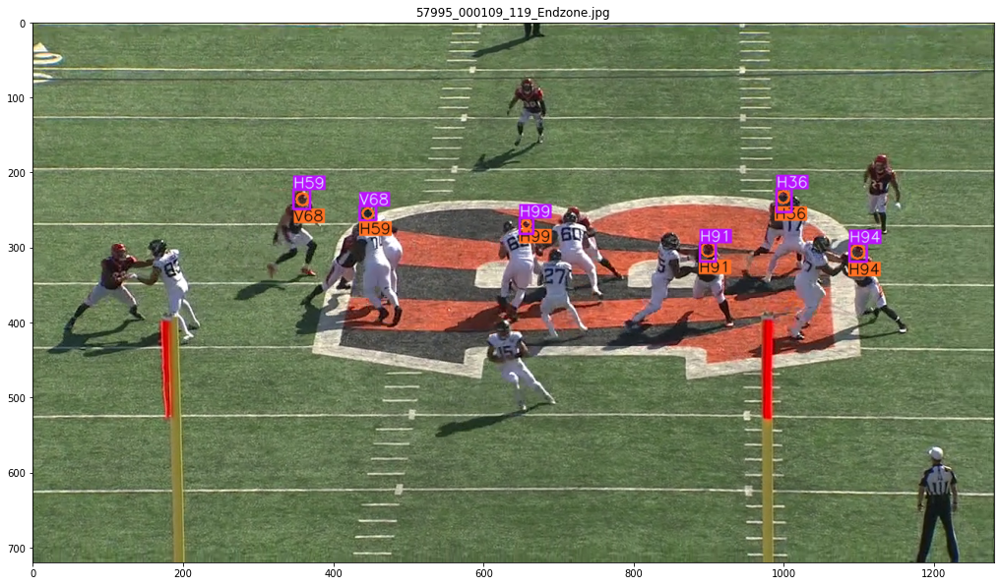

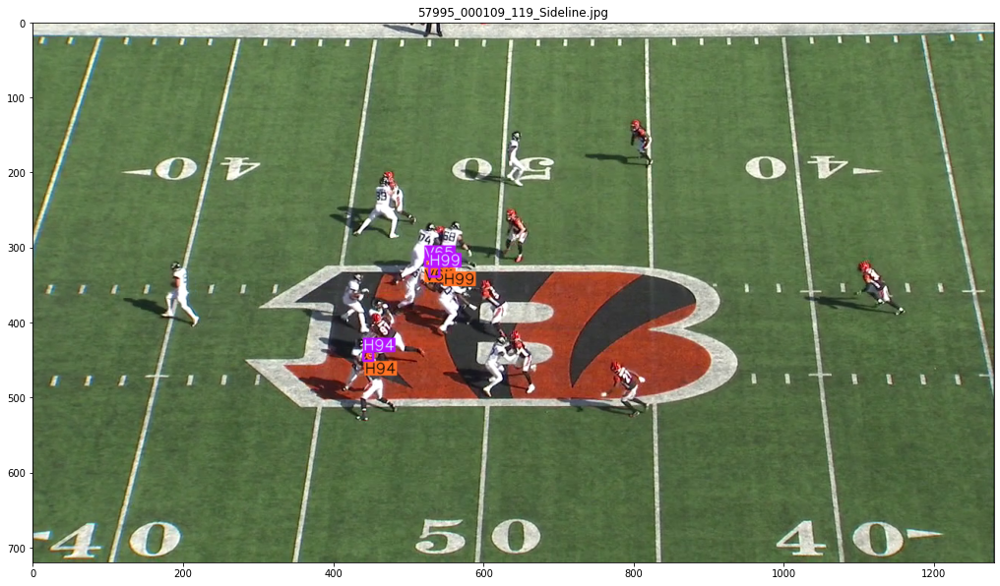

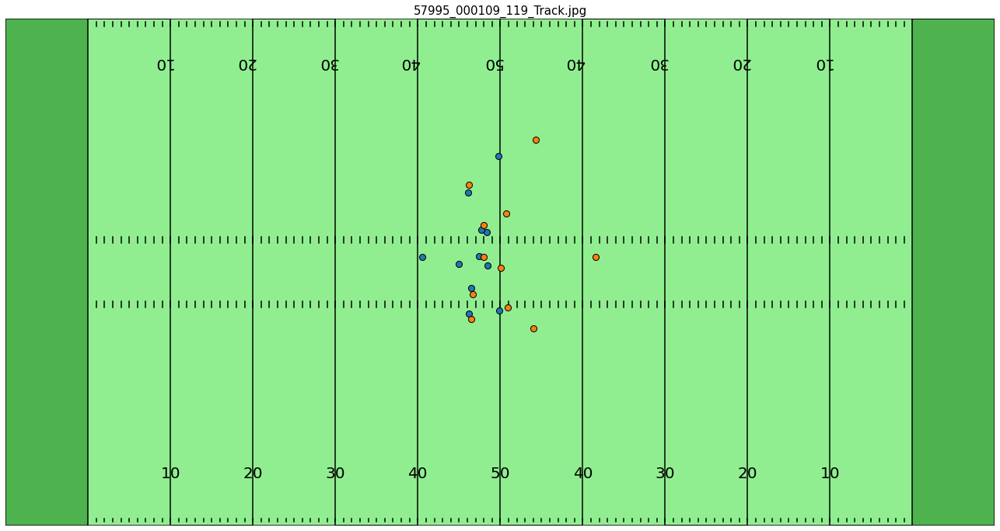

In [6]:
import pandas as pd
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import math
from helmet_assignment.video import video_with_predictions
from IPython.display import Video, display
from helmet_assignment.score import NFLAssignmentScorer, check_submission
from helmet_assignment.features import add_track_features
import sys
from PIL import Image


def find_nearest(array, value):
    value = int(value)
    array = np.asarray(array).astype(int)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def create_football_field(
    linenumbers=True,
    endzones=True,
    highlight_line=False,
    highlight_line_number=50,
    highlighted_name="Line of Scrimmage",
    fifty_is_los=False,
    figsize=(12, 6.33),
    field_color="lightgreen",
    ez_color='forestgreen',
    ax=None,):
    """
    Function that plots the football field for viewing plays.
    Allows for showing or hiding endzones.
    """
    rect = patches.Rectangle(
        (0, 0),
        120,
        53.3,
        linewidth=0.1,
        edgecolor="r",
        facecolor=field_color,
        zorder=0,
    )

    if ax is None:
        fig, ax = plt.subplots(1, figsize=figsize)
    ax.add_patch(rect)

    plt.plot([10, 10, 10, 20, 20, 30, 30, 40, 40, 50, 50, 60, 60, 70, 70, 80,
              80, 90, 90, 100, 100, 110, 110, 120, 0, 0, 120, 120],
             [0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3,
              53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 53.3, 0, 0, 53.3],
             color='black')

    if fifty_is_los:
        ax.plot([60, 60], [0, 53.3], color="gold")
        ax.text(62, 50, "<- Player Yardline at Snap", color="gold")
    # Endzones
    if endzones:
        ez1 = patches.Rectangle(
            (0, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor="black",
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ez2 = patches.Rectangle(
            (110, 0),
            120,
            53.3,
            linewidth=0.1,
            edgecolor="black",
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ax.add_patch(ez1)
        ax.add_patch(ez2)
    ax.axis("off")
    if linenumbers:
        for x in range(20, 110, 10):
            numb = x
            if x > 50:
                numb = 120 - x
            ax.text(
                x,
                5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color="black",
            )
            ax.text(
                x - 0.95,
                53.3 - 5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color="black",
                rotation=180,
            )
    if endzones:
        hash_range = range(11, 110)
    else:
        hash_range = range(1, 120)

    for x in hash_range:
        ax.plot([x, x], [0.4, 0.7], color="black")
        ax.plot([x, x], [53.0, 52.5], color="black")
        ax.plot([x, x], [22.91, 23.57], color="black")
        ax.plot([x, x], [29.73, 30.39], color="black")

    if highlight_line:
        hl = highlight_line_number + 10
        ax.plot([hl, hl], [0, 53.3], color="yellow")
        ax.text(hl + 2, 50, "<- {}".format(highlighted_name), color="yellow")

    border = patches.Rectangle(
        (-5, -5),
        120 + 10,
        53.3 + 10,
        linewidth=0.1,
        edgecolor="orange",
        facecolor="white",
        alpha=0,
        zorder=0,
    )
    ax.add_patch(border)
    ax.set_xlim((0, 120))
    ax.set_ylim((0, 53.3))
    return ax

def plot_one_box(x, im, color=(188, 19, 254), label=None, line_thickness=3):
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    c1, c2 = (int(x[0]), int(x[2])), (int(x[0]+x[1]), int(x[2]+x[3]))
    cv2.rectangle(im, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(im, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    return im

def plot_gt_box(x, im, color=(255,113,36), label=None, line_thickness=3):
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    c1, c2 = (int(x[0]), int(x[2])), (int(x[0]+x[1]), int(x[2]+x[3]))
    cv2.circle(im, center=(int(x[0]+x[1]/2),int(x[2]+x[3]/2)),radius=int(max(x[1]/3,x[3]/3)),color=color, thickness=tl)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c3 = c1[0] + t_size[0], c2[1] + t_size[1] + 3
        cv2.rectangle(im, (c1[0],c2[1]), c3, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c3[1]-2), 0, tl / 3, [0, 0, 0], thickness=tf, lineType=cv2.LINE_AA)
    return im

def box_linalg_norm(l1,w1,t1,h1,l2,w2,t2,h2):
    return np.linalg.norm([l1-l2,w1-w2,t1-t2,h1-h2])
    
if os.environ['PWD'] == '/':
    ENTRY = 'input' # local run
if os.environ['PWD'] == '/kaggle/working':
    ENTRY = '../input' # kaggle run

BASE_DIR = f'{ENTRY}/nfl-health-and-safety-helmet-assignment'
WRONG_ONLY = True
random.seed(44)

train_labels = pd.read_csv(f'{BASE_DIR}/train_labels.csv')
train_labels['game_play'] = train_labels['video_frame'].apply(lambda x: '_'.join(x.split('_')[0:2]))

tracking = pd.read_csv(f'{BASE_DIR}/train_player_tracking.csv')
tracking = add_track_features(tracking)

submission = pd.read_csv(f'submission_0p705.csv')
submission['video'] = submission['video_frame'].apply(lambda x: '_'.join(x.split('_')[:3]))
submission['frame'] = submission['video_frame'].apply(lambda x: int(x.split('_')[-1]))
submission['right'] = submission['left'] + submission['width']
submission['down'] = submission['top'] + submission['height']
submission['game_play'] = submission['video'].apply(lambda x: '_'.join(x.split('_')[0:2]))
submission['view'] = submission['video'].apply(lambda x: x.split('_')[2])
print('Total number of videos:',submission.video.nunique())

all_gameplays = sorted(submission['game_play'].unique()) # все видео submission-файла
train_labels = train_labels.loc[train_labels['game_play'].isin(all_gameplays)]

gameplays = [random.choice(all_gameplays)] # тестовое видео
for gameplay in gameplays: # перебираем видео
    total_frames_min = submission[submission['game_play'] == gameplay].drop_duplicates(['frame', 'view']).drop_duplicates('view', keep='last').frame.min()
      
    frames_print = [random.choice(range(total_frames_min))] # Тестовый кадр
    # frames_print = [1, int(total_frames_min/2), total_frames_min] # первый, последний и средний кадры 
    # merge_frames = [] # для коллажа 3на3
    for frame in frames_print: # перебираем кадры
        # merge_views = [] # для коллажа 1на3
        for view in ['Endzone', 'Sideline']:
            # Картинка
            video_path = f'{BASE_DIR}/train/{gameplay}_{view}.mp4'
            cap = cv2.VideoCapture(video_path) # обращаемся к видеофайлу
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame-1) # Устанавливаем индекс кадра, который будет извлекаться из видеопотока (индексация начинается от 0)
            success, image = cap.read() # Считываем кадр(картинку) , метод возвращает флаг success (True , False) и image — саму картинку (массив numpy)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Меняем цветовое пространство на RGB
            
            output = submission[(submission['game_play'] == gameplay) & (submission['view'] == view) & (submission['frame'] == frame)]
            gt_output = train_labels[train_labels['video_frame'] == str(gameplay + '_' + view + '_' + str(frame))]

            if WRONG_ONLY == True:
                output = output[['left', 'width', 'top','height','label']]
                gt_output = gt_output[['left', 'width', 'top','height','label']]
                all_boxes = pd.merge(output,gt_output, on='label',how='outer',suffixes=('_sbm','_gt'))
                all_boxes = all_boxes[['label', 'left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt']]
                all_boxes['linalg'] = all_boxes[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt']].apply(lambda x: box_linalg_norm(x.left_sbm, x.width_sbm, x.top_sbm, x.height_sbm, x.left_gt, x.width_gt, x.top_gt, x.height_gt), axis=1)
                NORM_THRE = 5
                wrong_boxes = all_boxes.loc[all_boxes['linalg'] > NORM_THRE]
                for wb in wrong_boxes[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','label']].values:
                    bboxes = wb[:4]
                    label = f'{wb[8]}'
                    im = plot_gt_box(bboxes, image, label=label,line_thickness=2)
                    bboxes = wb[4:8]
                    im = plot_one_box(bboxes, image, label=label, line_thickness=2)
                
            else:
                # Боксы модели
                for x in output.loc[:,['left', 'width', 'top','height','label']].values: # перебираем шлемы
                    bboxes = x[:4]
                    label = f'{x[4]}'
                    im = plot_one_box(bboxes, image, label=label, line_thickness=2)
                
                # Боксы truth
                for x in gt_output.loc[:,['left', 'width', 'top','height','label']].values: # перебираем шлемы
                    bboxes = x[:4]
                    label = f'{x[4]}'
                    im = plot_gt_box(bboxes, image, label=label,line_thickness=2)

            fig, ax = plt.subplots(figsize=(17.5, 12))
            filename = gameplay+ '_' + str(frame) +'_'+view +'.jpg'
            ax.set_title(filename)
            plt.imshow(im)
            image_folder = 'submission_inspector'
            # plt.savefig(image_folder+'/'+filename,dpi = 100)
            # plt.close(fig)
            # merge_views += [image_folder+'/'+filename]
        
        ##### Tracking
        tracking_this_video = tracking[(tracking['game_play'] == gameplay)]
        nearest_frame_tracking = find_nearest(tracking_this_video['est_frame'].values, frame) # Находим предполагаемый кадр из трека по номеру кадра
        example_tracks =  tracking_this_video.loc[tracking_this_video['est_frame'] == nearest_frame_tracking]
        ax = create_football_field(figsize=(22.8, 12)) # figsize=(12, 6.33)
        for team, d in example_tracks.groupby("team"):
            ax.scatter(d["x"], d["y"], label=team, s=65, lw=1, edgecolors="black", zorder=5)
        ax.legend().remove()
        filename = gameplay  + '_' + str(frame) + '_Track'+'.jpg'
        ax.set_title(filename, fontsize=15)
        # plt.savefig(image_folder+'/'+filename,dpi = 100)
        # plt.close()
        # merge_views += [image_folder+'/'+filename]

        # # append videos for merge_veiws
        # images = [Image.open(x) for x in merge_views]
        # widths, heights = zip(*(i.size for i in images))
        # total_width = sum(widths)
        # max_height = max(heights)
        # new_im = Image.new('RGB', (total_width, max_height))
        # x_offset = 0
        # for im in images:
        #     new_im.paste(im, (x_offset,0))
        #     x_offset += im.size[0]
        
        # new_im.save(image_folder+'/' + gameplay+'_'+str(frame)+'_EST.jpg')

        # merge_frames += merge_views
    
    # append videos for merge_frames
    # images = [Image.open(x) for x in merge_frames]
    # widths, heights = zip(*(i.size for i in images))
    # total_width = int(sum(widths)/3)
    # total_height = int(sum(heights)/3)

    # new_im = Image.new('RGB', (total_width, total_height))
    # x_offset = 0
    # y_offset = 0
    # for im in range(len(images)):
    #     img = images[im]
    #     if ((im+1)%3) != 0 :
    #         new_im.paste(img, (x_offset,y_offset))
    #         x_offset += img.size[0]
    #     else:
    #         new_im.paste(img, (x_offset,y_offset))
    #         x_offset = 0
    #         y_offset += img.size[1]
        
    # new_im.save(image_folder+'_merge_frames/' + gameplay+'_EST_all.jpg')

# Чистовая версия

In [4]:
import pandas as pd
import random
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import math
from helmet_assignment.video import video_with_predictions
from IPython.display import Video, display
from helmet_assignment.score import NFLAssignmentScorer, check_submission
from helmet_assignment.features import add_track_features
import sys
from PIL import Image


def find_nearest(array, value):
    value = int(value)
    array = np.asarray(array).astype(int)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def create_football_field(
    linenumbers=True,
    endzones=True,
    highlight_line=False,
    highlight_line_number=50,
    highlighted_name="Line of Scrimmage",
    fifty_is_los=False,
    figsize=(12, 6.33),
    field_color="lightgreen",
    ez_color='forestgreen',
    ax=None,):
    """
    Function that plots the football field for viewing plays.
    Allows for showing or hiding endzones.
    """
    rect = patches.Rectangle(
        (0, 0),
        120,
        53.3,
        linewidth=0.1,
        edgecolor="r",
        facecolor=field_color,
        zorder=0,
    )

    if ax is None:
        fig, ax = plt.subplots(1, figsize=figsize)
    ax.add_patch(rect)

    plt.plot([10, 10, 10, 20, 20, 30, 30, 40, 40, 50, 50, 60, 60, 70, 70, 80,
              80, 90, 90, 100, 100, 110, 110, 120, 0, 0, 120, 120],
             [0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3,
              53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 53.3, 0, 0, 53.3],
             color='black')

    if fifty_is_los:
        ax.plot([60, 60], [0, 53.3], color="gold")
        ax.text(62, 50, "<- Player Yardline at Snap", color="gold")
    # Endzones
    if endzones:
        ez1 = patches.Rectangle(
            (0, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor="black",
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ez2 = patches.Rectangle(
            (110, 0),
            120,
            53.3,
            linewidth=0.1,
            edgecolor="black",
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ax.add_patch(ez1)
        ax.add_patch(ez2)
    ax.axis("off")
    if linenumbers:
        for x in range(20, 110, 10):
            numb = x
            if x > 50:
                numb = 120 - x
            ax.text(
                x,
                5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color="black",
            )
            ax.text(
                x - 0.95,
                53.3 - 5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color="black",
                rotation=180,
            )
    if endzones:
        hash_range = range(11, 110)
    else:
        hash_range = range(1, 120)

    for x in hash_range:
        ax.plot([x, x], [0.4, 0.7], color="black")
        ax.plot([x, x], [53.0, 52.5], color="black")
        ax.plot([x, x], [22.91, 23.57], color="black")
        ax.plot([x, x], [29.73, 30.39], color="black")

    if highlight_line:
        hl = highlight_line_number + 10
        ax.plot([hl, hl], [0, 53.3], color="yellow")
        ax.text(hl + 2, 50, "<- {}".format(highlighted_name), color="yellow")

    border = patches.Rectangle(
        (-5, -5),
        120 + 10,
        53.3 + 10,
        linewidth=0.1,
        edgecolor="orange",
        facecolor="white",
        alpha=0,
        zorder=0,
    )
    ax.add_patch(border)
    ax.set_xlim((0, 120))
    ax.set_ylim((0, 53.3))
    return ax

def plot_one_box(x, im, color=(188, 19, 254), label=None, line_thickness=3):
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    c1, c2 = (int(x[0]), int(x[2])), (int(x[0]+x[1]), int(x[2]+x[3]))
    cv2.rectangle(im, c1, c2, color, thickness=2*tl, lineType=cv2.LINE_AA)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(im, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    return im

def plot_gt_box(x, im, color=(255,113,36), label=None, line_thickness=3):
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    c1, c2 = (int(x[0]), int(x[2])), (int(x[0]+x[1]), int(x[2]+x[3]))
    cv2.circle(im, center=(int(x[0]+x[1]/2),int(x[2]+x[3]/2)),radius=int(max(x[1]/3,x[3]/3)),color=color, thickness=2*tl)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c3 = c1[0] + t_size[0], c2[1] + t_size[1] + 3
        cv2.rectangle(im, (c1[0],c2[1]), c3, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c3[1]-2), 0, tl / 3, [0, 0, 0], thickness=tf, lineType=cv2.LINE_AA)
    return im

def box_linalg_norm(l1,w1,t1,h1,l2,w2,t2,h2):
    return np.linalg.norm([l1-l2,w1-w2,t1-t2,h1-h2])

# Paths    
if os.environ['PWD'] == '/':
    ENTRY = 'input' # local run
if os.environ['PWD'] == '/kaggle/working':
    ENTRY = '../input' # kaggle run

BASE_DIR = f'{ENTRY}/nfl-health-and-safety-helmet-assignment'


In [115]:
##### Задать пути
train_labels = pd.read_csv(f'{BASE_DIR}/train_labels.csv')
tracking = pd.read_csv(f'{BASE_DIR}/train_player_tracking.csv')
submission = pd.read_csv(f'submission_0p705.csv')
# submission = pd.read_csv(f'submission_0p723_train.csv')

####################################################################################################
train_labels['game_play'] = train_labels['video_frame'].apply(lambda x: '_'.join(x.split('_')[0:2]))
tracking = add_track_features(tracking)
submission['video'] = submission['video_frame'].apply(lambda x: '_'.join(x.split('_')[:3]))
submission['frame'] = submission['video_frame'].apply(lambda x: int(x.split('_')[-1]))
submission['right'] = submission['left'] + submission['width']
submission['down'] = submission['top'] + submission['height']
submission['game_play'] = submission['video'].apply(lambda x: '_'.join(x.split('_')[0:2]))
submission['view'] = submission['video'].apply(lambda x: x.split('_')[2])
print('Total number of videos in submission:',submission.video.nunique())
all_gameplays = sorted(submission['game_play'].unique()) # список всех видео submission-файла
train_labels = train_labels.loc[train_labels['game_play'].isin(all_gameplays)]

Total number of videos in submission: 6


In [116]:
# Кадры с наибольшим количеством ошибок
NORM_THRE = 5
full_df = pd.merge(submission,train_labels, on=['video_frame', 'label'],how='outer',suffixes=('_sbm','_gt'))
full_df['linalg'] = full_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt']].apply(lambda x: box_linalg_norm(x.left_sbm, x.width_sbm, x.top_sbm, x.height_sbm, x.left_gt, x.width_gt, x.top_gt, x.height_gt), axis=1)
errors_counter = full_df.loc[(full_df['linalg'] > NORM_THRE) | (full_df['linalg'].isna() == True)][['video_frame','label']].groupby('video_frame').count().sort_values('label',ascending=False)
errors_counter.head(10)

,label
video_frame,
57906_000718_Sideline_320,16
57906_000718_Sideline_319,16
58102_002798_Sideline_315,16
57906_000718_Sideline_324,16
58102_002798_Sideline_323,15
57906_000718_Endzone_126,15
57906_000718_Sideline_318,15
58102_002798_Sideline_336,15
58102_002798_Sideline_331,15


320 Sideline


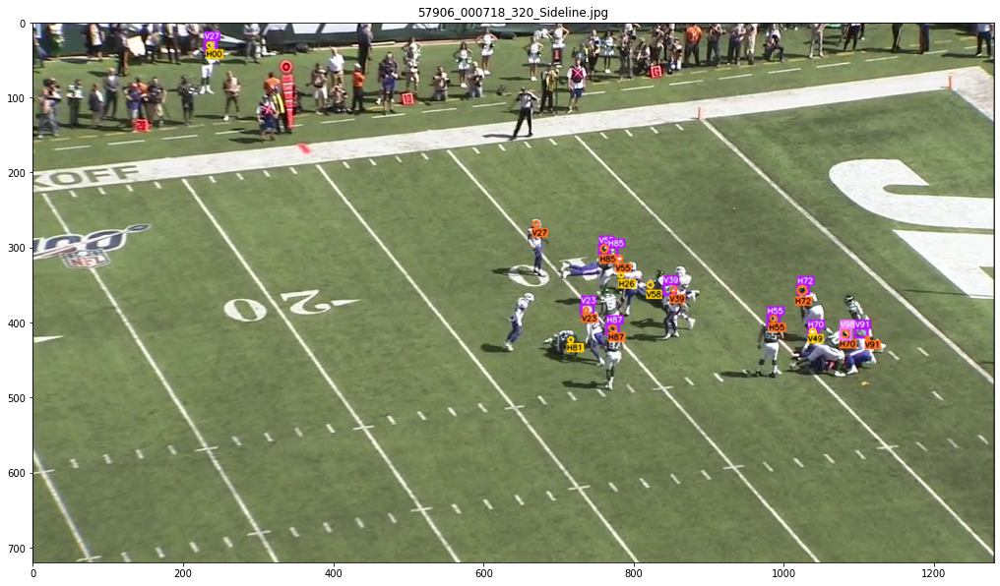

In [72]:
gameplays = ['57906_000718'] # '57906_000718_Endzone_2' # кадр для проверки
frames_print = [320] #[2]
views = ['Sideline']
def submission_inspector(gameplays, frames_print,views,frames_print,
                         missed_target = True, # Отсутствующие боксы
                         false_target = True, # Лишние боксы
                         shifted_target = True, # Сильно смещенные боксы (см. NORM_THRE)
                         plot_full_df = False, # Отображать полный DataFrame
                         plot_wrong_df = False, # Отображать DataFrame с ошибками
                         plot_tracking = False, # Отображать трэк
                         line_thickness = 1): # Толщина линий боксов и текста):
    if not gameplays:
        gameplays = [random.choice(all_gameplays)] # тестовое видео
    for gameplay in gameplays: # перебираем видео
        total_frames_min = submission[submission['game_play'] == gameplay].drop_duplicates(['frame', 'view']).drop_duplicates('view', keep='last').frame.min()

        if not frames_print:
            frames_print = [random.choice(range(total_frames_min))] # Тестовый кадр
            # frames_print = [1, int(total_frames_min/2), total_frames_min] # первый, последний и средний кадры 
        for frame in frames_print: # перебираем кадры
            if not views:
                views = ['Endzone', 'Sideline']

            for view in views: # перебираем ракурсы
                print(frame, view)
                video_path = f'{BASE_DIR}/train/{gameplay}_{view}.mp4'
                cap = cv2.VideoCapture(video_path) # обращаемся к видеофайлу
                cap.set(cv2.CAP_PROP_POS_FRAMES, frame-1) # Устанавливаем индекс кадра, который будет извлекаться из видеопотока (индексация начинается от 0)
                _, image = cap.read() # Считываем кадр(картинку) , метод возвращает флаг success (True , False) и image — саму картинку (массив numpy)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Меняем цветовое пространство на RGB

                this_submission = submission.loc[(submission['game_play'] == gameplay) & (submission['view'] == view) & (submission['frame'] == frame)]
                this_tr_labels = train_labels.loc[(train_labels['game_play'] == gameplay) & (train_labels['view'] == view) & (train_labels['frame'] == frame)]
                merged_df = pd.merge(this_submission,this_tr_labels, on=['video_frame', 'label'],how='outer',suffixes=('_sbm','_gt'))

                merged_df['linalg'] = merged_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt']].apply(lambda x: box_linalg_norm(x.left_sbm, x.width_sbm, x.top_sbm, x.height_sbm, x.left_gt, x.width_gt, x.top_gt, x.height_gt), axis=1)
                im = image.copy()

                if missed_target or false_target or shifted_target == True:
                    error_boxes = merged_df.loc[(merged_df['linalg'] > NORM_THRE) | (merged_df['linalg'].isna() == True)]
                    for wb in error_boxes[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','label']].values:
                        label = f'{wb[8]}'
                        # false_target
                        if (np.isnan(wb[0]) == False) and (np.isnan(wb[4])== True) and (false_target == True):
                            bboxes = wb[:4]
                            im = plot_one_box(bboxes ,image,color=(255,113,255), label=label,line_thickness=line_thickness)
                        
                        # missed_target
                        if (np.isnan(wb[4])== False) and (np.isnan(wb[0]) ==True) and (missed_target == True):
                            bboxes = wb[4:8]
                            im = plot_gt_box(bboxes, image, color=(255,207,0), label=label, line_thickness=line_thickness)
                        
                        # shifted_target
                        if (np.isnan(wb[0]) == False) and (np.isnan(wb[4])== False) and (shifted_target == True):
                            bboxes = wb[:4]
                            im = plot_one_box(bboxes ,image, label=label,line_thickness=line_thickness)
                            bboxes = wb[4:8]
                            im = plot_gt_box(bboxes, image, label=label, line_thickness=line_thickness)
                    
                else:
                    assert (missed_target + false_target + shifted_target) == False
                    # Боксы модели
                    for x in merged_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'label']].dropna().values: # перебираем шлемы
                        bboxes = x[:4]
                        label = f'{x[4]}'
                        im = plot_one_box(bboxes, image, label=label, line_thickness=line_thickness)
                    
                    # Боксы truth
                    for x in merged_df[['left_gt', 'width_gt', 'top_gt', 'height_gt','label']].dropna().values: # перебираем шлемы
                        bboxes = x[:4]
                        label = f'{x[4]}'
                        im = plot_gt_box(bboxes, image, label=label,line_thickness=line_thickness)

                fig, ax = plt.subplots(figsize=(17.5, 12))
                filename = gameplay+ '_' + str(frame) +'_'+view +'.jpg'
                ax.set_title(filename)
                plt.imshow(im)

                if plot_full_df == True:
                    display(merged_df[['label','left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','linalg']])
                
                if plot_wrong_df == True:
                    display(error_boxes[['label','left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','linalg']])
            
            ##### Tracking
            if plot_tracking == True:
                tracking_this_video = tracking[(tracking['game_play'] == gameplay)]
                nearest_frame_tracking = find_nearest(tracking_this_video['est_frame'].values, frame) # Находим предполагаемый кадр из трека по номеру кадра
                example_tracks =  tracking_this_video.loc[tracking_this_video['est_frame'] == nearest_frame_tracking]
                ax = create_football_field(figsize=(22.8, 12)) # figsize=(12, 6.33)
                for team, d in example_tracks.groupby("team"):
                    ax.scatter(d["x"], d["y"], label=team, s=65, lw=1, edgecolors="black", zorder=5)
                ax.legend().remove()
                filename = gameplay  + '_' + str(frame) + '_Track'+'.jpg'
                ax.set_title(filename, fontsize=15)


submission_inspector(gameplays, frames_print, views)

In [118]:
print('sbm_videos_list:',submission.game_play.unique())
print('gt_videos_list:',train_labels.game_play.unique())

df_sbm_score = pd.DataFrame(columns=['game_play','view_','frame','frame_score'])

for game_play in train_labels.game_play.unique():
    this_gameplay_gt = train_labels.loc[train_labels['game_play'] == game_play].copy()
    this_gameplay_sbm = submission.loc[submission['game_play'] == game_play].copy()
    for view in ['Sideline', 'Endzone']:
        this_view_gt = this_gameplay_gt.loc[this_gameplay_gt['view'] == view]
        this_view_sbm = this_gameplay_sbm.loc[this_gameplay_sbm['view'] == view]
        for frame in this_view_sbm.frame.unique():
            this_frame_gt = this_view_gt.loc[this_view_gt['frame'] == frame]
            this_frame_sbm = this_view_sbm.loc[this_view_sbm['frame'] == frame]
            frame_scorer = NFLAssignmentScorer(this_frame_gt, impact_weight=1000)
            frame_score = frame_scorer.score(this_frame_sbm)
            df_sbm_score = df_sbm_score.append({'game_play':game_play,'view_':view,'frame':frame,'frame_score':frame_score}, ignore_index=True)
df_sbm_score.sort_values('frame_score')


sbm_videos_list: ['57906_000718' '57995_000109' '58102_002798']
gt_videos_list: ['57906_000718' '57995_000109' '58102_002798']


,game_play,view_,frame,frame_score
471,57906_000718,Endzone,32,0.003979
2191,58102_002798,Sideline,260,0.005944
2233,58102_002798,Sideline,302,0.008815
571,57906_000718,Endzone,132,0.008841
725,57906_000718,Endzone,286,0.010784
...,...,...,...,...
1119,57995_000109,Sideline,246,1.000000
1118,57995_000109,Sideline,245,1.000000
1117,57995_000109,Sideline,244,1.000000
1133,57995_000109,Sideline,260,1.000000


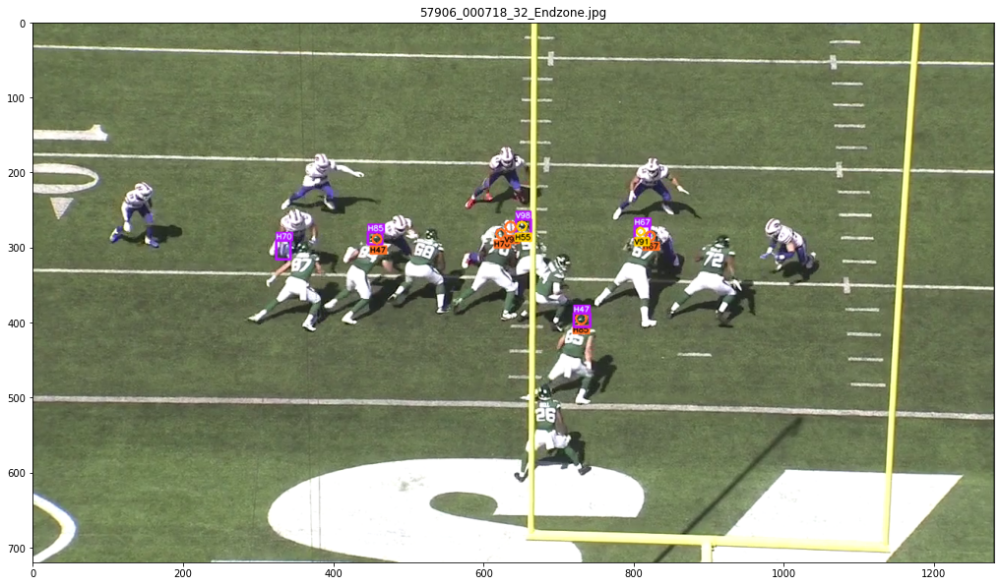

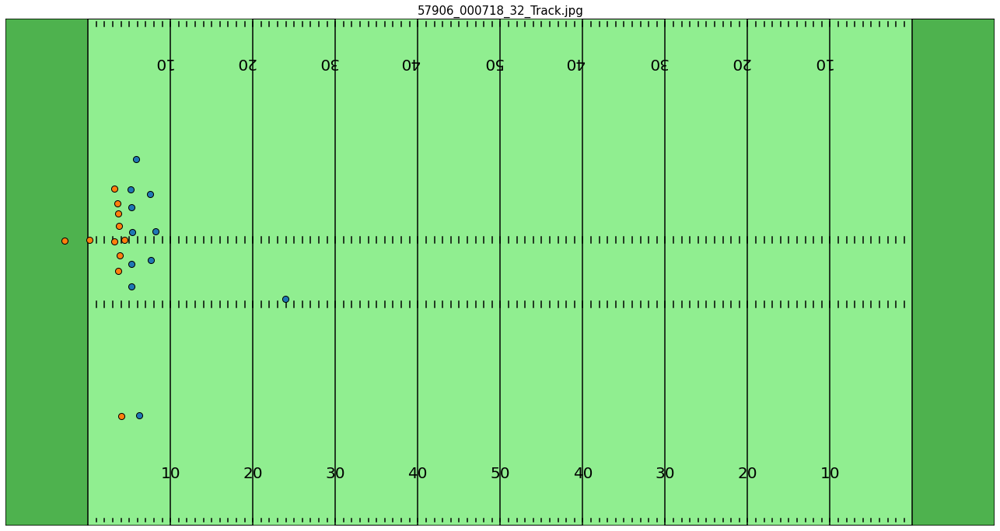

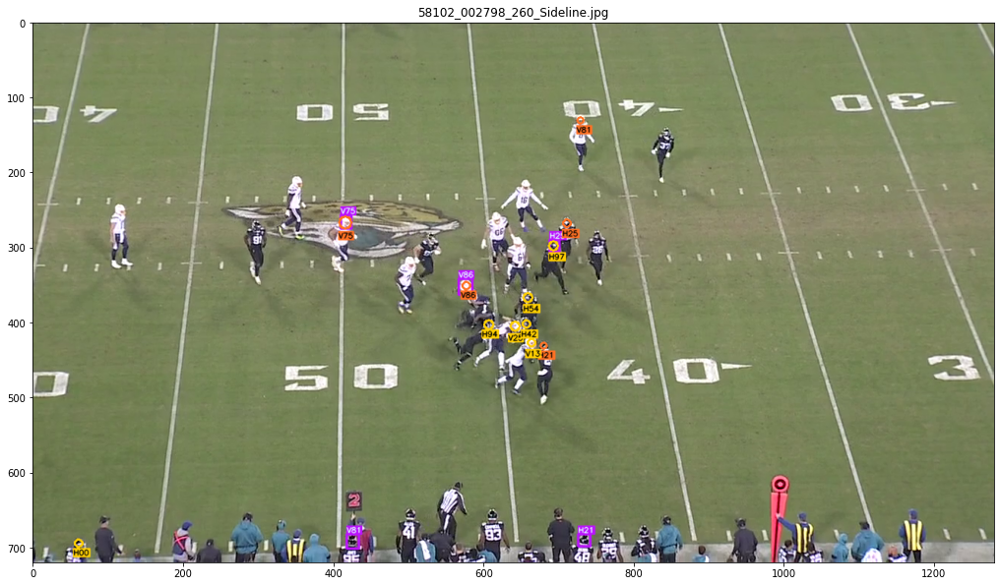

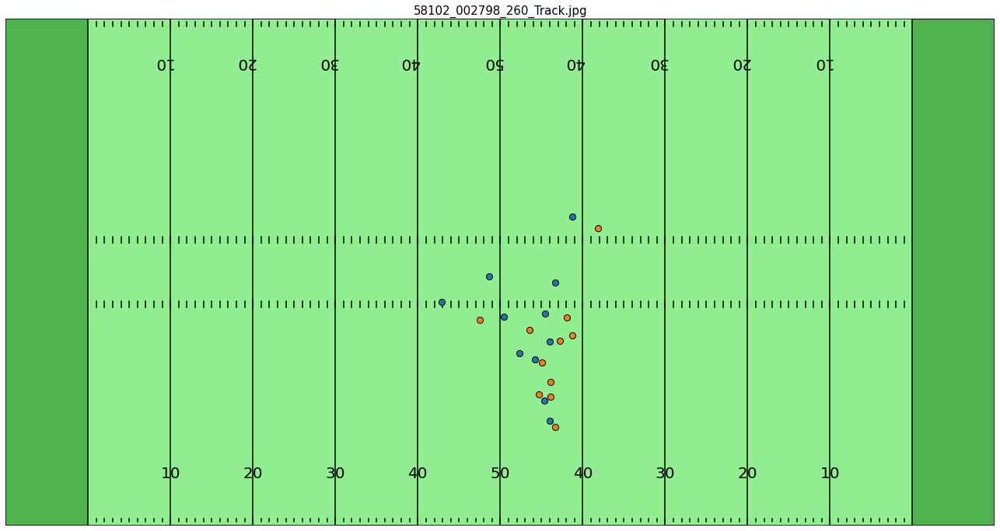

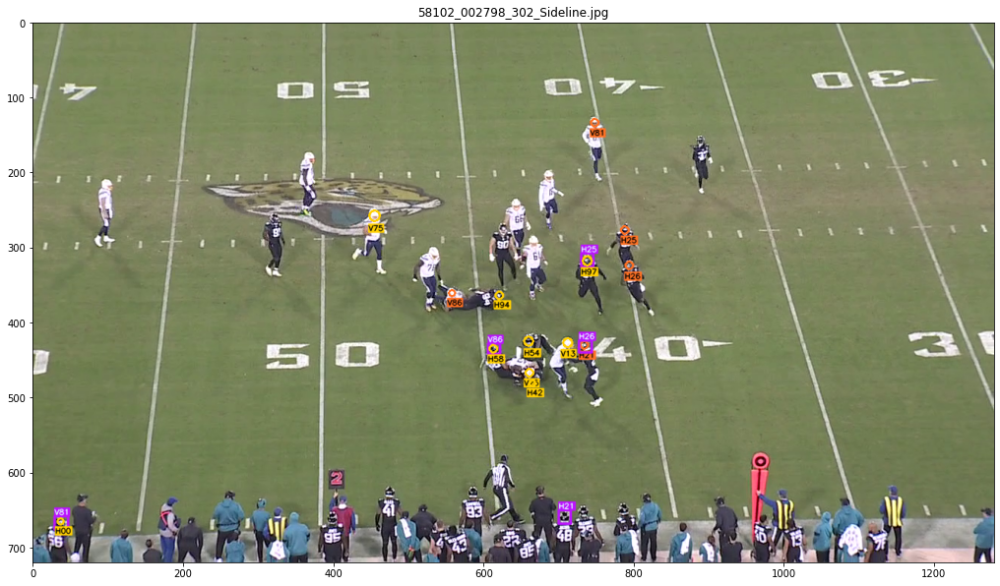

...

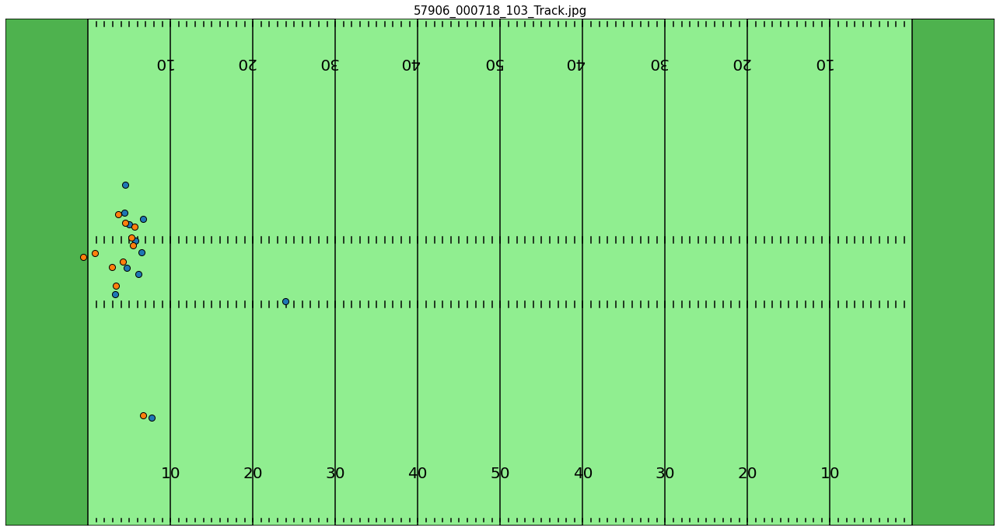

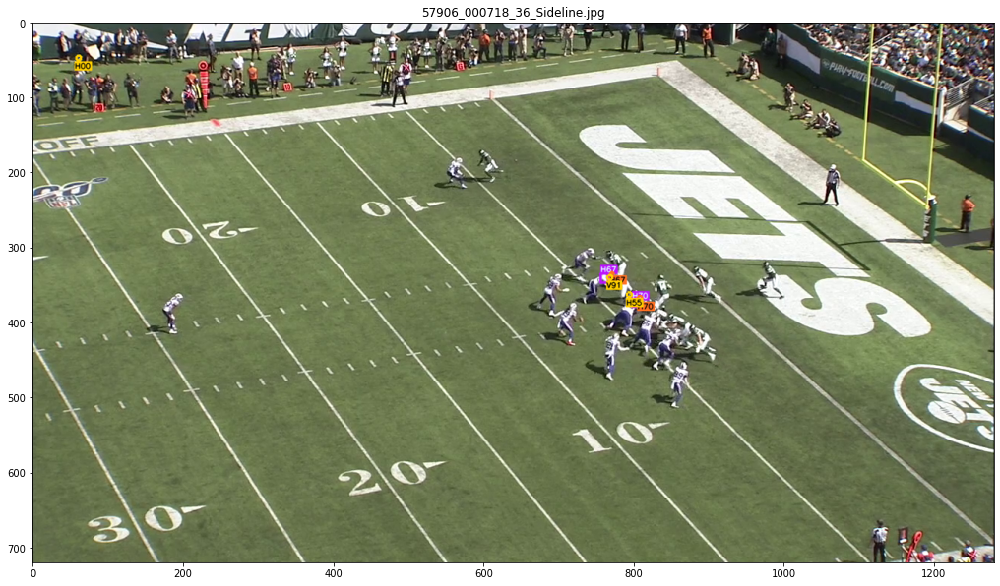

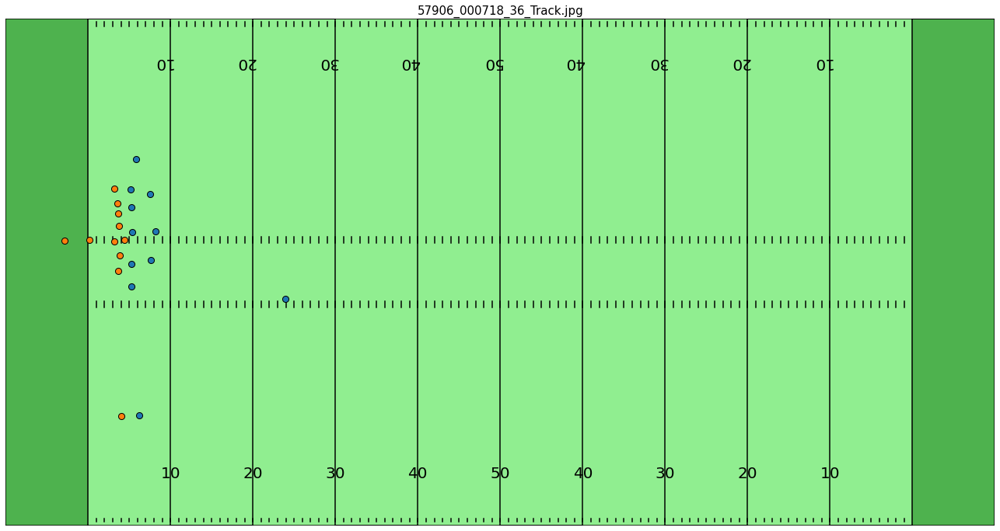

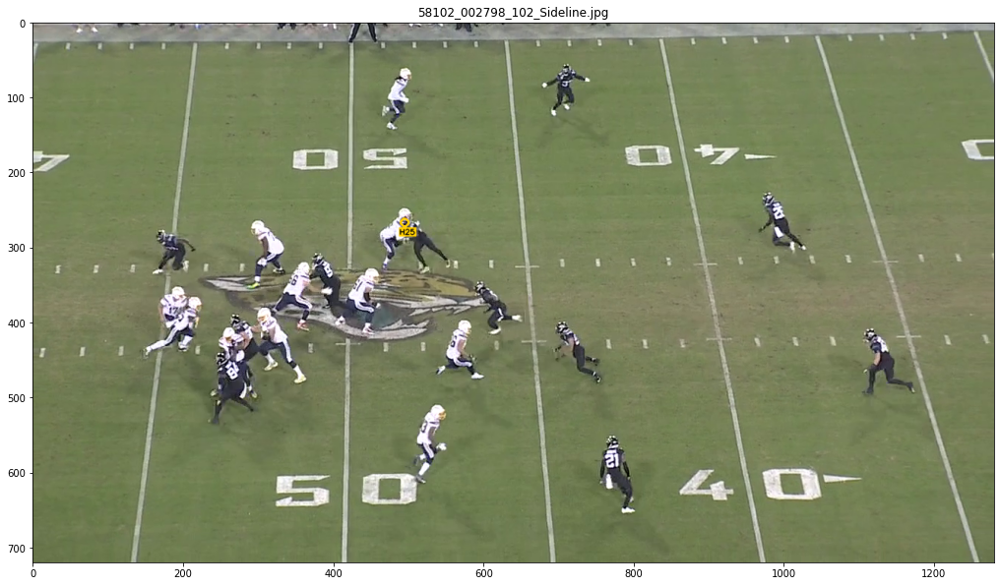

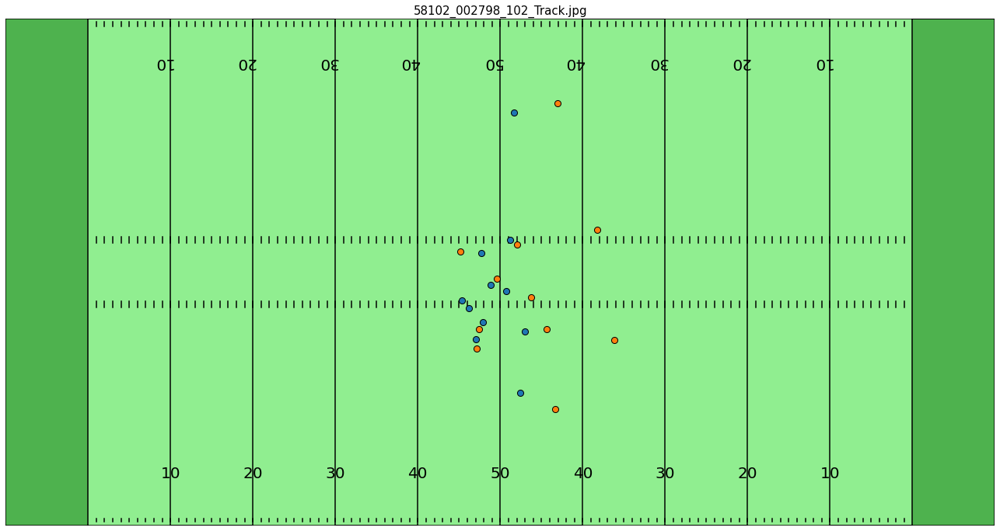

In [129]:
for row in df_sbm_score.sort_values('frame_score').head(10).iterrows():
    row = row[1]
    submission_single_inspector(row.game_play,row.frame,row.view_, plot_image=True)

In [126]:
this_frame_gt

,video_frame,gameKey,playID,view,video,frame,label,left,width,top,height,impactType,isDefinitiveImpact,isSidelinePlayer,game_play
876931,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,V61,0,23,170,46,None,False,False,58102_002798
876932,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,V78,22,43,252,38,None,False,False,58102_002798
876933,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H25,48,40,79,40,None,False,False,58102_002798
876934,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H97,436,43,158,45,None,False,False,58102_002798
876935,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H26,532,39,146,44,None,False,False,58102_002798
876936,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H58,756,43,406,37,None,False,False,58102_002798
876937,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H42,782,26,393,25,None,False,False,58102_002798
876938,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H54,794,38,183,43,None,False,False,58102_002798
876939,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,H21,924,34,129,44,None,False,False,58102_002798
876940,58102_002798_Endzone_366,58102,2798,Endzone,58102_002798_Endzone.mp4,366,V13,1159,41,124,48,None,False,False,58102_002798


In [128]:
this_frame_sbm

,video_frame,label,left,width,top,height,video,frame,right,down,game_play,view
40286,58102_002798_Endzone_366,V61,0,23,171,39,58102_002798_Endzone,366,23,210,58102_002798,Endzone
40287,58102_002798_Endzone_366,V78,23,40,252,36,58102_002798_Endzone,366,63,288,58102_002798,Endzone
40288,58102_002798_Endzone_366,H25,48,40,79,43,58102_002798_Endzone,366,88,122,58102_002798,Endzone
40289,58102_002798_Endzone_366,H26,436,45,158,48,58102_002798_Endzone,366,481,206,58102_002798,Endzone
40290,58102_002798_Endzone_366,H54,531,41,148,46,58102_002798_Endzone,366,572,194,58102_002798,Endzone
40291,58102_002798_Endzone_366,H42,761,38,402,36,58102_002798_Endzone,366,799,438,58102_002798,Endzone
40292,58102_002798_Endzone_366,H21,924,34,129,45,58102_002798_Endzone,366,958,174,58102_002798,Endzone
40293,58102_002798_Endzone_366,V76,1159,44,124,44,58102_002798_Endzone,366,1203,168,58102_002798,Endzone


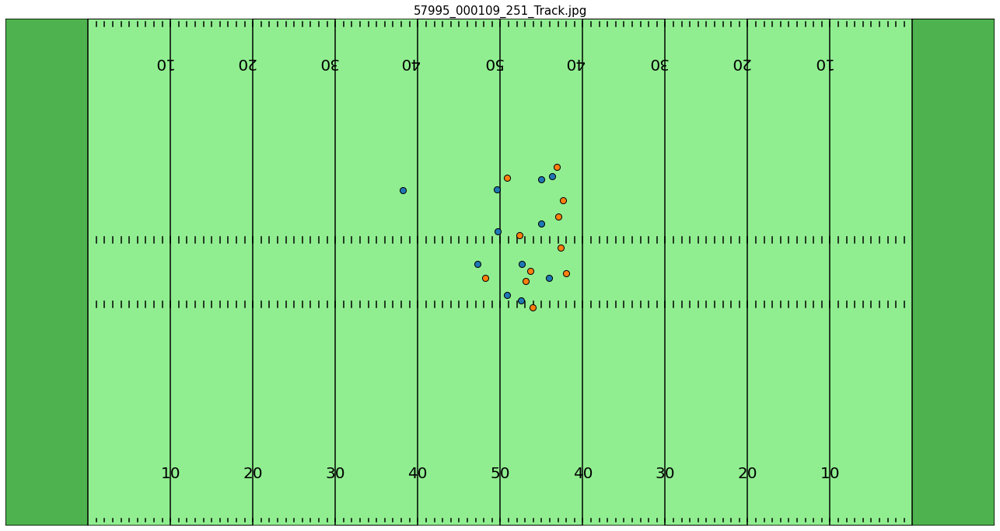

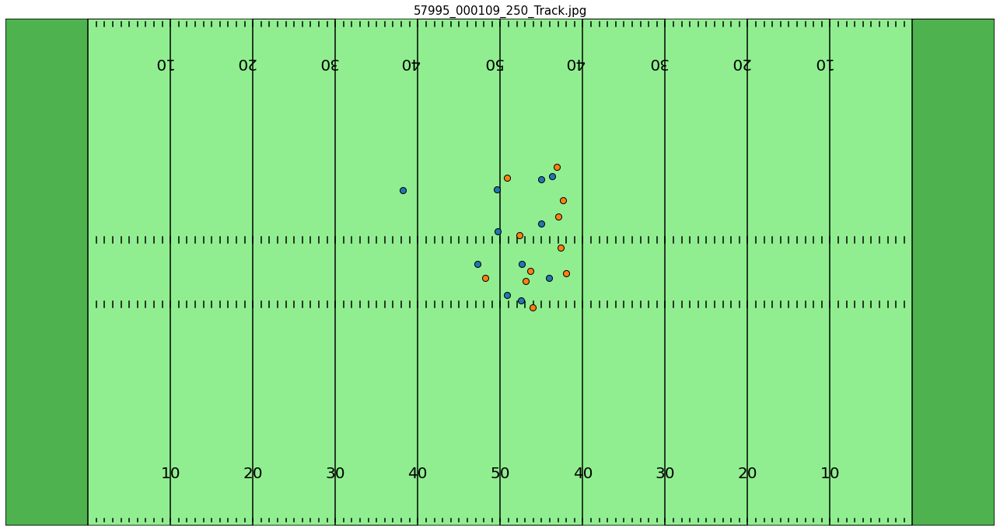

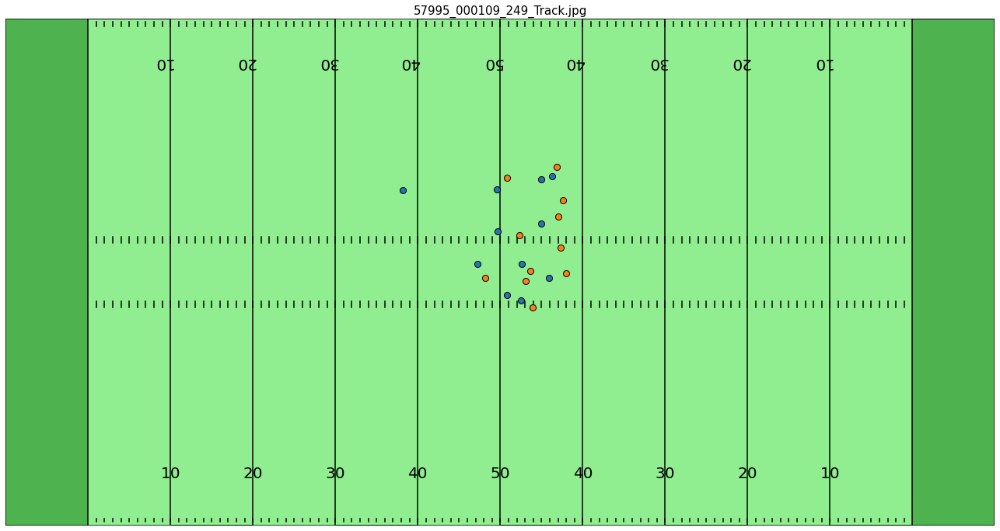

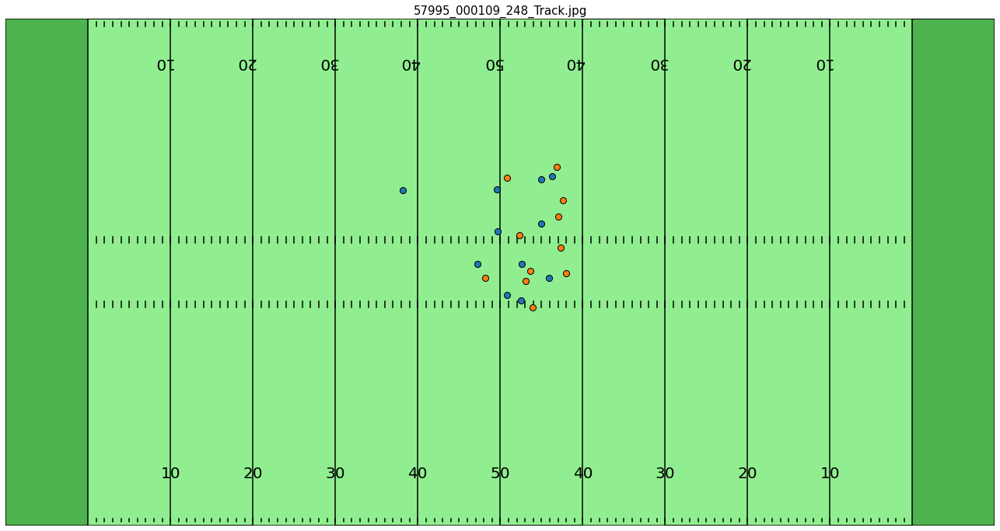

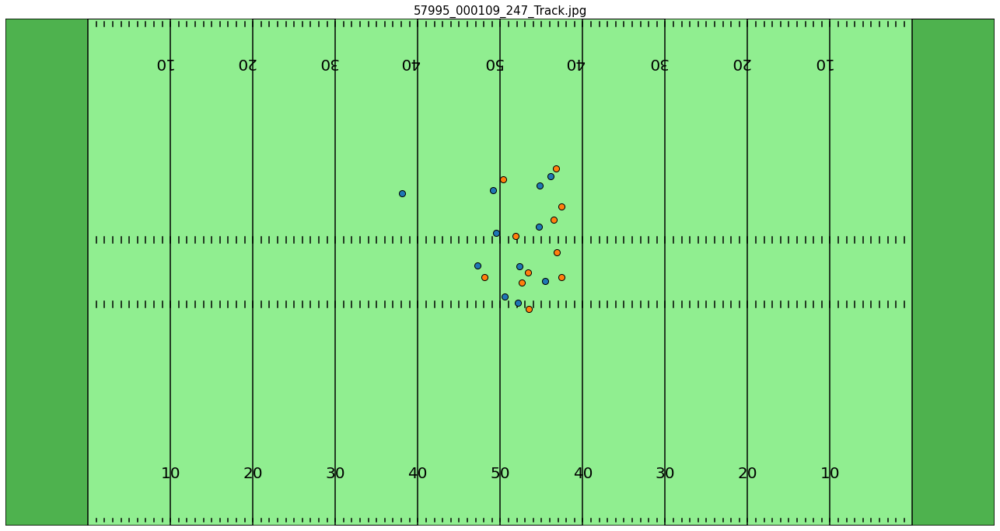

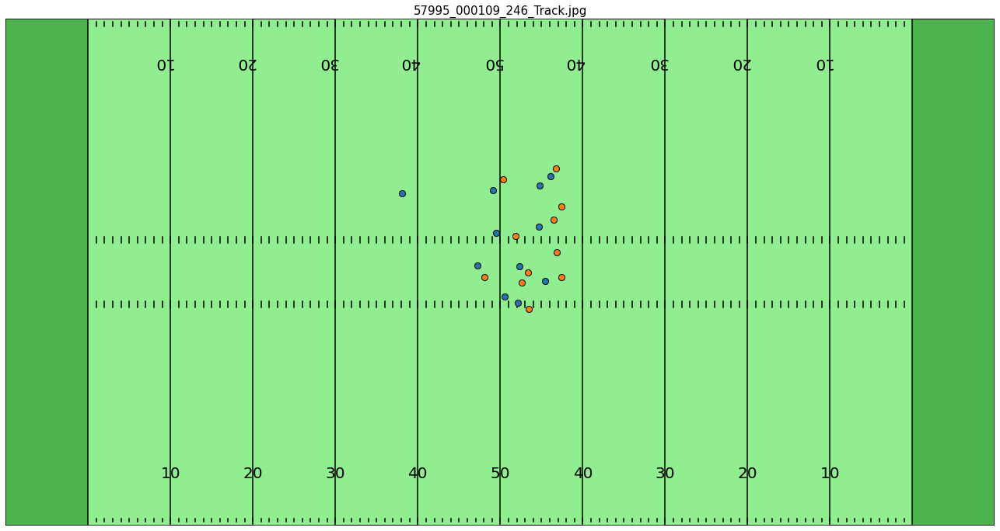

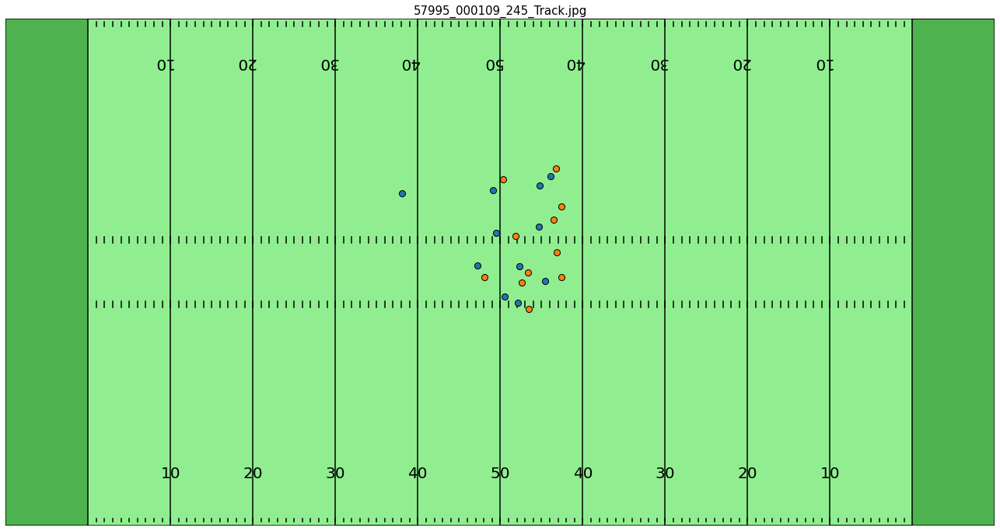

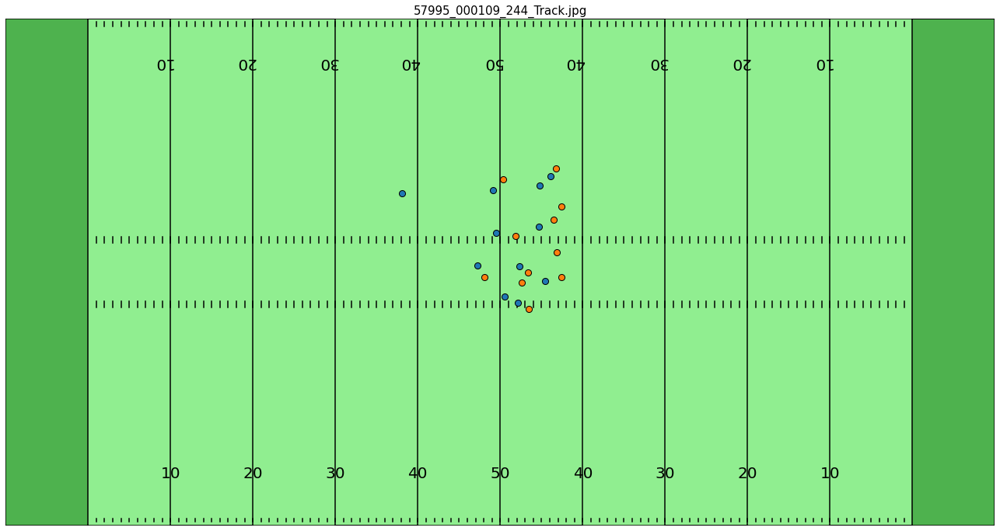

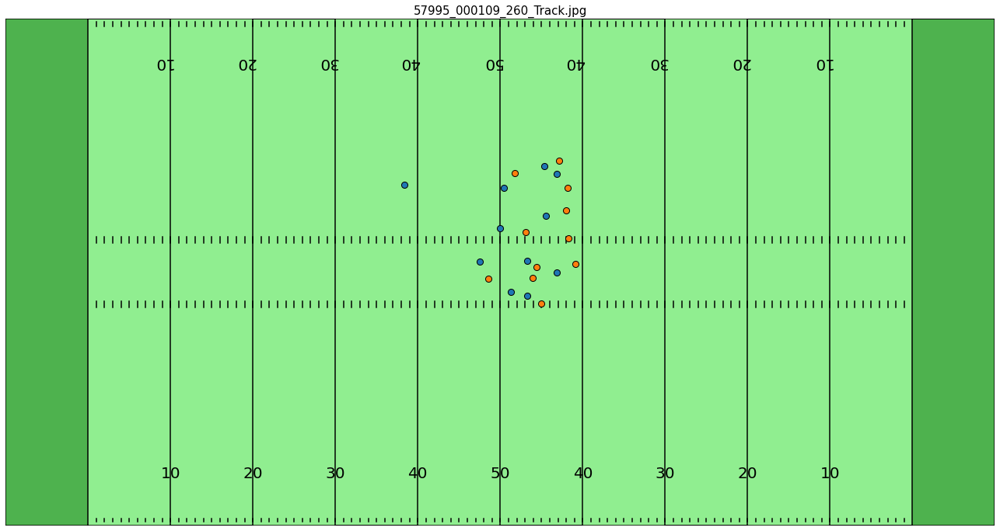

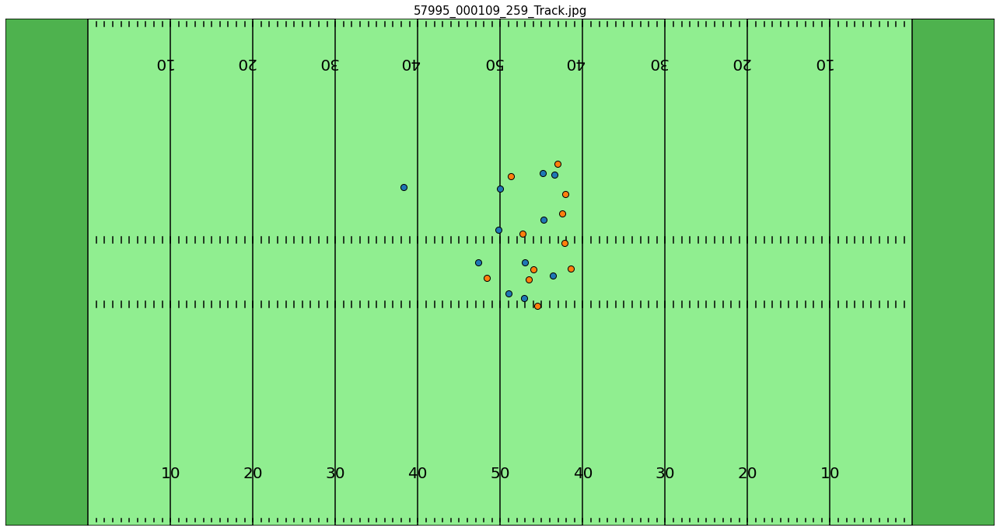

In [125]:
for row in df_sbm_score.sort_values('frame_score').tail(10).iterrows():
    row = row[1]
    submission_single_inspector(row.game_play,row.frame,row.view_,plot_image=False)

,label,left_sbm,width_sbm,top_sbm,height_sbm,left_gt,width_gt,top_gt,height_gt,linalg
5,H55,781.0,11.0,348.0,12.0,779,9,363,6,16.401219
10,V93,802.0,12.0,303.0,12.0,806,9,305,7,7.348469
18,H00,NaN,NaN,NaN,NaN,130,8,65,9,NaN
19,V98,NaN,NaN,NaN,NaN,783,5,366,5,NaN
20,V49,NaN,NaN,NaN,NaN,784,8,351,8,NaN
21,H67,NaN,NaN,NaN,NaN,792,8,348,7,NaN
22,H72,NaN,NaN,NaN,NaN,806,9,309,10,NaN


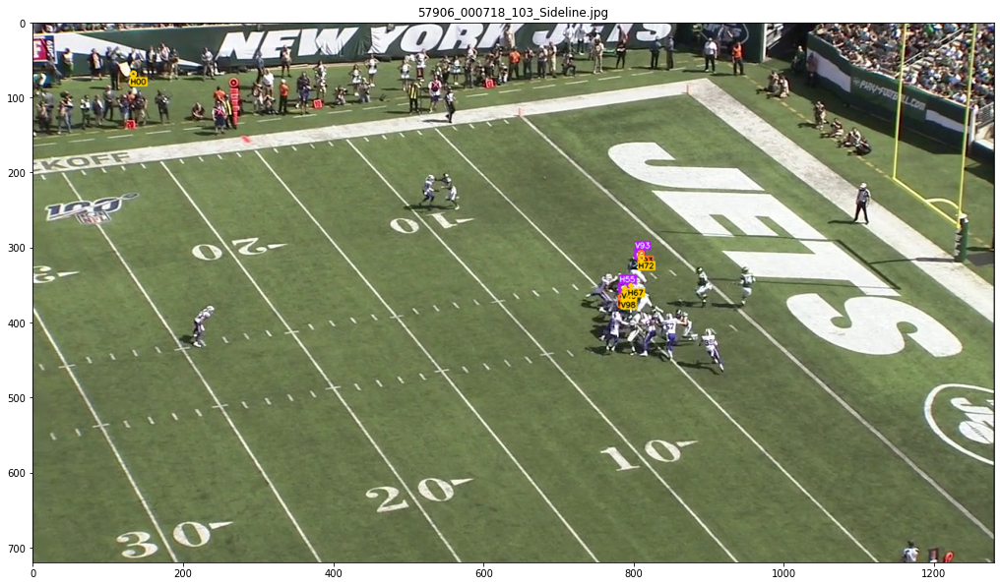

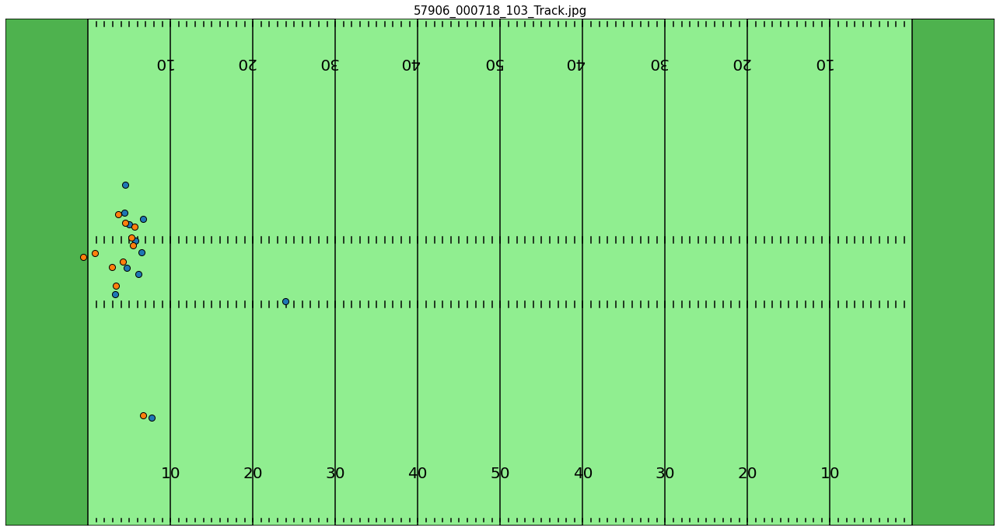

In [132]:
def submission_single_inspector(submission, train_labels, gameplay, frame,view,
                                plot_tracking = False,
                                plot_image=True,
                                missed_target = True, 
                                false_target = True, 
                                shifted_target = True, 
                                plot_full_df = False, 
                                plot_wrong_df = False, 
 
                                line_thickness = 1,
                                ):
    """Plot single frame for single view (and/or single track)

    Args:
        submission (pd.DataFrame): predicts of model
        train_labels (pd.DataFrame): ground truth labels
        gameplay (str): Gameplay 
        frame (int): Frame number
        view (str): Вид. Endzone или Sideview
        plot_tracking (bool, optional): Отображать трэк. Defaults to False.
        plot_image (bool, optional): Plot image with boxes. Defaults to True.
        missed_target (bool, optional): Отсутствующие боксы. Defaults to True.
        false_target (bool, optional): Лишние боксы.. Defaults to True.
        shifted_target (bool, optional): Сильно смещенные боксы (см. NORM_THRE). Defaults to True.
        plot_full_df (bool, optional): Отображать полный DataFrame. Defaults to False.
        plot_wrong_df (bool, optional): Отображать DataFrame с ошибками. Defaults to False.
        line_thickness (int, optional): Value for all plotx. Defaults to 1.
    """                                 
    video_path = f'{BASE_DIR}/train/{gameplay}_{view}.mp4'
    cap = cv2.VideoCapture(video_path) # обращаемся к видеофайлу
    cap.set(cv2.CAP_PROP_POS_FRAMES, frame-1) # Устанавливаем индекс кадра, который будет извлекаться из видеопотока (индексация начинается от 0)
    _, image = cap.read() # Считываем кадр(картинку) , метод возвращает флаг success (True , False) и image — саму картинку (массив numpy)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Меняем цветовое пространство на RGB

    this_submission = submission.loc[(submission['game_play'] == gameplay) & (submission['view'] == view) & (submission['frame'] == frame)]
    this_tr_labels = train_labels.loc[(train_labels['game_play'] == gameplay) & (train_labels['view'] == view) & (train_labels['frame'] == frame)]
    merged_df = pd.merge(this_submission,this_tr_labels, on=['video_frame', 'label'],how='outer',suffixes=('_sbm','_gt'))

    merged_df['linalg'] = merged_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt']].apply(lambda x: box_linalg_norm(x.left_sbm, x.width_sbm, x.top_sbm, x.height_sbm, x.left_gt, x.width_gt, x.top_gt, x.height_gt), axis=1)
    im = image.copy()

    if missed_target or false_target or shifted_target == True:
        error_boxes = merged_df.loc[(merged_df['linalg'] > NORM_THRE) | (merged_df['linalg'].isna() == True)]
        for wb in error_boxes[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','label']].values:
            label = f'{wb[8]}'
            # false_target
            if (np.isnan(wb[0]) == False) and (np.isnan(wb[4])== True) and (false_target == True):
                bboxes = wb[:4]
                im = plot_one_box(bboxes ,image,color=(255,113,255), label=label,line_thickness=line_thickness)
            
            # missed_target
            if (np.isnan(wb[4])== False) and (np.isnan(wb[0]) ==True) and (missed_target == True):
                bboxes = wb[4:8]
                im = plot_gt_box(bboxes, image, color=(255,207,0), label=label, line_thickness=line_thickness)
            
            # shifted_target
            if (np.isnan(wb[0]) == False) and (np.isnan(wb[4])== False) and (shifted_target == True):
                bboxes = wb[:4]
                im = plot_one_box(bboxes ,image, label=label,line_thickness=line_thickness)
                bboxes = wb[4:8]
                im = plot_gt_box(bboxes, image, label=label, line_thickness=line_thickness)
        
    else:
        assert (missed_target + false_target + shifted_target) == False
        # Боксы модели
        for x in merged_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'label']].dropna().values: # перебираем шлемы
            bboxes = x[:4]
            label = f'{x[4]}'
            im = plot_one_box(bboxes, image, label=label, line_thickness=line_thickness)
        
        # Боксы truth
        for x in merged_df[['left_gt', 'width_gt', 'top_gt', 'height_gt','label']].dropna().values: # перебираем шлемы
            bboxes = x[:4]
            label = f'{x[4]}'
            im = plot_gt_box(bboxes, image, label=label,line_thickness=line_thickness)

    if plot_image:
        fig, ax = plt.subplots(figsize=(17.5, 12))
        filename = gameplay+ '_' + str(frame) +'_'+view +'.jpg'
        ax.set_title(filename)
        plt.imshow(im)

    if plot_full_df == True:
        display(merged_df[['label','left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','linalg']])
    
    if plot_wrong_df == True:
        display(error_boxes[['label','left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','linalg']])

    ##### Tracking
    if plot_tracking == True:
        tracking_this_video = tracking[(tracking['game_play'] == gameplay)]
        nearest_frame_tracking = find_nearest(tracking_this_video['est_frame'].values, frame) # Находим предполагаемый кадр из трека по номеру кадра
        example_tracks =  tracking_this_video.loc[tracking_this_video['est_frame'] == nearest_frame_tracking]
        ax = create_football_field(figsize=(22.8, 12)) # figsize=(12, 6.33)
        for team, d in example_tracks.groupby("team"):
            ax.scatter(d["x"], d["y"], label=team, s=65, lw=1, edgecolors="black", zorder=5)
        ax.legend().remove()
        filename = gameplay  + '_' + str(frame) + '_Track'+'.jpg'
        ax.set_title(filename, fontsize=15)

submission_single_inspector(submission, train_labels, '57906_000718',103,'Sideline',plot_tracking = True,plot_wrong_df=True)

In [133]:
all_train_labels = pd.read_csv(f'{BASE_DIR}/train_labels.csv')

all_train_labels.loc[all_train_labels['video_frame'] == '57906_000718_Sideline_103'].sort_values(['left','top'])

In [141]:
helmets = pd.read_csv(f"{BASE_DIR}/train_baseline_helmets.csv")

In [140]:

helmets.loc[helmets['video_frame'] == '57906_000718_Sideline_103'].sort_values(['left','top'])

,video_frame,left,width,top,height,conf
843919,57906_000718_Sideline_103,130,10,65,9,0.050201
843947,57906_000718_Sideline_103,231,13,377,13,0.808105
843946,57906_000718_Sideline_103,524,12,203,10,0.805176
843937,57906_000718_Sideline_103,545,10,200,11,0.706543
843925,57906_000718_Sideline_103,550,9,213,9,0.192871
843921,57906_000718_Sideline_103,760,10,372,11,0.155151
843944,57906_000718_Sideline_103,762,10,334,12,0.801270
843926,57906_000718_Sideline_103,772,8,337,11,0.193481
843927,57906_000718_Sideline_103,772,10,347,11,0.215820
843935,57906_000718_Sideline_103,772,10,386,10,0.666992


In [19]:
missed_target = True
false_target = True
shifted_target = True

print((missed_target or false_target or shifted_target) == True)
print((missed_target + false_target + shifted_target) == False)

True
False


# Версия с закомменченными строками для коллажа

In [ ]:
# Отображаемые боксы
missed_target = True # Отсутствующие боксы
false_target = True # Лишние боксы
shifted_target = True # Сильно смещенные боксы (см. NORM_THRE)

# Отображать DataFrame
plot_full_df = False
plot_wrong_df = False

plot_tracking = False # Отображать трэкер

gameplays = ['57906_000718'] # '57906_000718_Endzone_2' # кадр для проверки
frames_print = [320] #[2]
views = ['Sideline']

line_thickness = 1 # Толщина линий боксов и текста
# random.seed(12)

if not gameplays:
    gameplays = [random.choice(all_gameplays)] # тестовое видео
for gameplay in gameplays: # перебираем видео
    total_frames_min = submission[submission['game_play'] == gameplay].drop_duplicates(['frame', 'view']).drop_duplicates('view', keep='last').frame.min()

    if not frames_print:
        frames_print = [random.choice(range(total_frames_min))] # Тестовый кадр
        # frames_print = [1, int(total_frames_min/2), total_frames_min] # первый, последний и средний кадры 
    # merge_frames = [] # для коллажа 3на3
    for frame in frames_print: # перебираем кадры
        # merge_views = [] # для коллажа 1на3
        if not views:
            views = ['Endzone', 'Sideline']

        for view in views:
            # Картинка
            print(frame, view)
            video_path = f'{BASE_DIR}/train/{gameplay}_{view}.mp4'
            cap = cv2.VideoCapture(video_path) # обращаемся к видеофайлу
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame-1) # Устанавливаем индекс кадра, который будет извлекаться из видеопотока (индексация начинается от 0)
            success, image = cap.read() # Считываем кадр(картинку) , метод возвращает флаг success (True , False) и image — саму картинку (массив numpy)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Меняем цветовое пространство на RGB

            this_submission = submission.loc[(submission['game_play'] == gameplay) & (submission['view'] == view) & (submission['frame'] == frame)]
            this_tr_labels = train_labels.loc[(train_labels['game_play'] == gameplay) & (train_labels['view'] == view) & (train_labels['frame'] == frame)]
            merged_df = pd.merge(this_submission,this_tr_labels, on=['video_frame', 'label'],how='outer',suffixes=('_sbm','_gt'))

            merged_df['linalg'] = merged_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt']].apply(lambda x: box_linalg_norm(x.left_sbm, x.width_sbm, x.top_sbm, x.height_sbm, x.left_gt, x.width_gt, x.top_gt, x.height_gt), axis=1)
            im = image.copy()

            if missed_target or false_target or shifted_target == True:
                error_boxes = merged_df.loc[(merged_df['linalg'] > NORM_THRE) | (merged_df['linalg'].isna() == True)]
                for wb in error_boxes[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','label']].values:
                    label = f'{wb[8]}'
                    if (np.isnan(wb[0]) == False) and (np.isnan(wb[4])== True) and (false_target == True):
                        bboxes = wb[:4]
                        im = plot_one_box(bboxes ,image,color=(255,113,255), label=label,line_thickness=line_thickness)
                    
                    if (np.isnan(wb[4])== False) and (np.isnan(wb[0]) ==True) and (missed_target == True):
                        bboxes = wb[4:8]
                        im = plot_gt_box(bboxes, image, color=(255,207,0), label=label, line_thickness=line_thickness)
                    
                    if (np.isnan(wb[0]) == False) and (np.isnan(wb[4])== False) and (shifted_target == True):
                        bboxes = wb[:4]
                        im = plot_one_box(bboxes ,image, label=label,line_thickness=line_thickness)
                        bboxes = wb[4:8]
                        im = plot_gt_box(bboxes, image, label=label, line_thickness=line_thickness)
                
            else:
                assert (missed_target + false_target + shifted_target) == False
                # Боксы модели
                for x in merged_df[['left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'label']].dropna().values: # перебираем шлемы
                    bboxes = x[:4]
                    label = f'{x[4]}'
                    im = plot_one_box(bboxes, image, label=label, line_thickness=line_thickness)
                
                # Боксы truth
                for x in merged_df[['left_gt', 'width_gt', 'top_gt', 'height_gt','label']].dropna().values: # перебираем шлемы
                    bboxes = x[:4]
                    label = f'{x[4]}'
                    im = plot_gt_box(bboxes, image, label=label,line_thickness=line_thickness)

            fig, ax = plt.subplots(figsize=(17.5, 12))
            filename = gameplay+ '_' + str(frame) +'_'+view +'.jpg'
            ax.set_title(filename)
            plt.imshow(im)
            image_folder = 'submission_inspector'
            # plt.savefig(image_folder+'/'+filename,dpi = 100)
            # plt.close(fig)
            # merge_views += [image_folder+'/'+filename]

            if plot_full_df == True:
                display(merged_df[['label','left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','linalg']])
            
            if plot_wrong_df == True:
                display(error_boxes[['label','left_sbm', 'width_sbm', 'top_sbm', 'height_sbm', 'left_gt', 'width_gt', 'top_gt', 'height_gt','linalg']])
        
        # plt.close()
        ##### Tracking
        if plot_tracking == True:
            tracking_this_video = tracking[(tracking['game_play'] == gameplay)]
            nearest_frame_tracking = find_nearest(tracking_this_video['est_frame'].values, frame) # Находим предполагаемый кадр из трека по номеру кадра
            example_tracks =  tracking_this_video.loc[tracking_this_video['est_frame'] == nearest_frame_tracking]
            ax = create_football_field(figsize=(22.8, 12)) # figsize=(12, 6.33)
            for team, d in example_tracks.groupby("team"):
                ax.scatter(d["x"], d["y"], label=team, s=65, lw=1, edgecolors="black", zorder=5)
            ax.legend().remove()
            filename = gameplay  + '_' + str(frame) + '_Track'+'.jpg'
            ax.set_title(filename, fontsize=15)
            # plt.savefig(image_folder+'/'+filename,dpi = 100)
            # plt.close()
            # merge_views += [image_folder+'/'+filename]


        
        # append videos for merge_veiws
        # images = [Image.open(x) for x in merge_views]
        # widths, heights = zip(*(i.size for i in images))
        # total_width = sum(widths)
        # max_height = max(heights)
        # new_im = Image.new('RGB', (total_width, max_height))
        # x_offset = 0
        # for im in images:
        #     new_im.paste(im, (x_offset,0))
        #     x_offset += im.size[0]
        
        # new_im.save(image_folder+'/' + gameplay+'_'+str(frame)+'_EST.jpg')

        # merge_frames += merge_views
    
    # append videos for merge_frames
    # images = [Image.open(x) for x in merge_frames]
    # widths, heights = zip(*(i.size for i in images))
    # total_width = int(sum(widths)/3)
    # total_height = int(sum(heights)/3)

    # new_im = Image.new('RGB', (total_width, total_height))
    # x_offset = 0
    # y_offset = 0
    # for im in range(len(images)):
    #     img = images[im]
    #     if ((im+1)%3) != 0 :
    #         new_im.paste(img, (x_offset,y_offset))
    #         x_offset += img.size[0]
    #     else:
    #         new_im.paste(img, (x_offset,y_offset))
    #         x_offset = 0
    #         y_offset += img.size[1]
        
    # new_im.save(image_folder+'_merge_frames/' + gameplay+'_EST_all.jpg')